In [1]:
import matplotlib.pyplot as plt
import shap
import pickle
import cloudpickle
import numpy as np
from comparers import ModelComparer
from explainers import generate_shap_explanations
from plots import plot_decision_boundary, plot_2d, plot_feature_importance_bar, plot_feature_importance_scatter,\
                  plot_feature_effects, plot_forces
from util import calc_feature_order, calc_class_order, calc_instance_order
shap.initjs()
%matplotlib inline
task_name = '01'

In [50]:
try:
    with open(task_name + '.models', 'rb') as f:
        comparer = pickle.load(f)
    with open(task_name + '.expl', 'rb') as f:
        explanations = pickle.load(f)
    print('loaded saved state')
except FileNotFoundError:
    pass

loaded saved state


# Setup Task

In [2]:
from sklearn.utils import resample
X, y = shap.datasets.adult()
feature_names = np.array(X.columns)
X = X.values
display_data = shap.datasets.adult(display=True)[0].values
X_explain, display_data_explain, y_explain = resample(X, display_data, y, replace=False, n_samples=15000, stratify=y, random_state=1)
n_features = len(feature_names)
n_samples = X.shape[0]

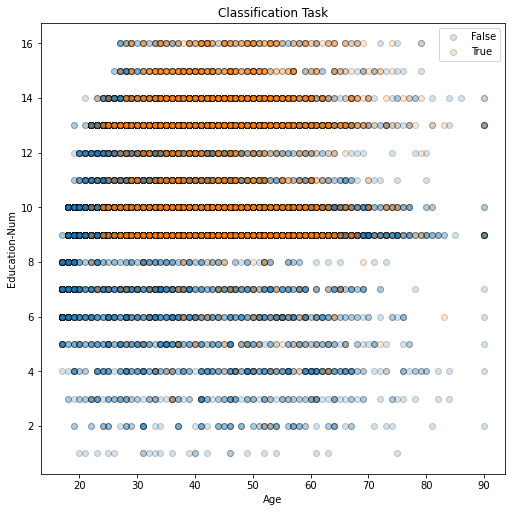

In [3]:
fig, ax = plt.subplots(figsize=(7, 7), constrained_layout=True)
plot_decision_boundary(X_explain, y_explain, 'Classification Task', feature_names,
                       X_display=display_data_explain, idx_x=0, idx_y=2, fig=fig, ax=ax, alpha=0.2)

In [4]:
%%time
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.utils.validation import check_X_y, check_array, check_is_fitted
from sklearn.utils.multiclass import unique_labels
from sklearn.linear_model import LogisticRegression

class ModifiedClassifier(BaseEstimator, ClassifierMixin):
    
    def  __init__(self, base_model):
        self.base_model = base_model
        
    def fit(self, X, y):
        return self
    
    @property
    def classes_(self):
        return self.base_model.classes_
    
    def predict(self, X):
        return self.base_model.predict(self._preprocess(X))
    
    def predict_proba(self, X):
        return self.base_model.predict_proba(self._preprocess(X))
    
    def predict_log_proba(self, X):
        return self.base_model.predict_log_proba(self._preprocess(X))
    
    def _preprocess(self, X):
        X2 = X.copy()
        X2[(40 <= X[:, 0]) & (X[:, 0] < 50), 2] += 1
        return X2
    
clf_a = LogisticRegression(C=1.0, max_iter=10000)
clf_a.fit(X, y)
clf_b = ModifiedClassifier(clf_a)
clf_b.fit(X, y)
comparer = ModelComparer(clf_a, clf_b, feature_names)
comparer.fit(X, y)
with open(task_name + '.models', 'wb') as f:
    cloudpickle.dump(comparer, f, pickle.HIGHEST_PROTOCOL)

CPU times: user 15.8 s, sys: 1.3 s, total: 17.1 s
Wall time: 9.44 s


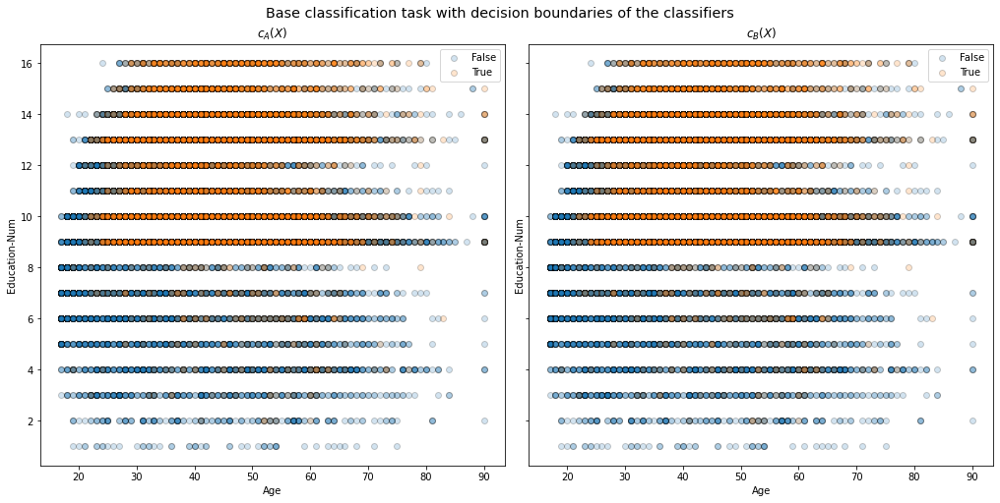

In [7]:
comparer.plot_individual_clf_decision_boundaries(X, display_data, y, kind='label', idx_x=0, idx_y=2, alpha=0.2)

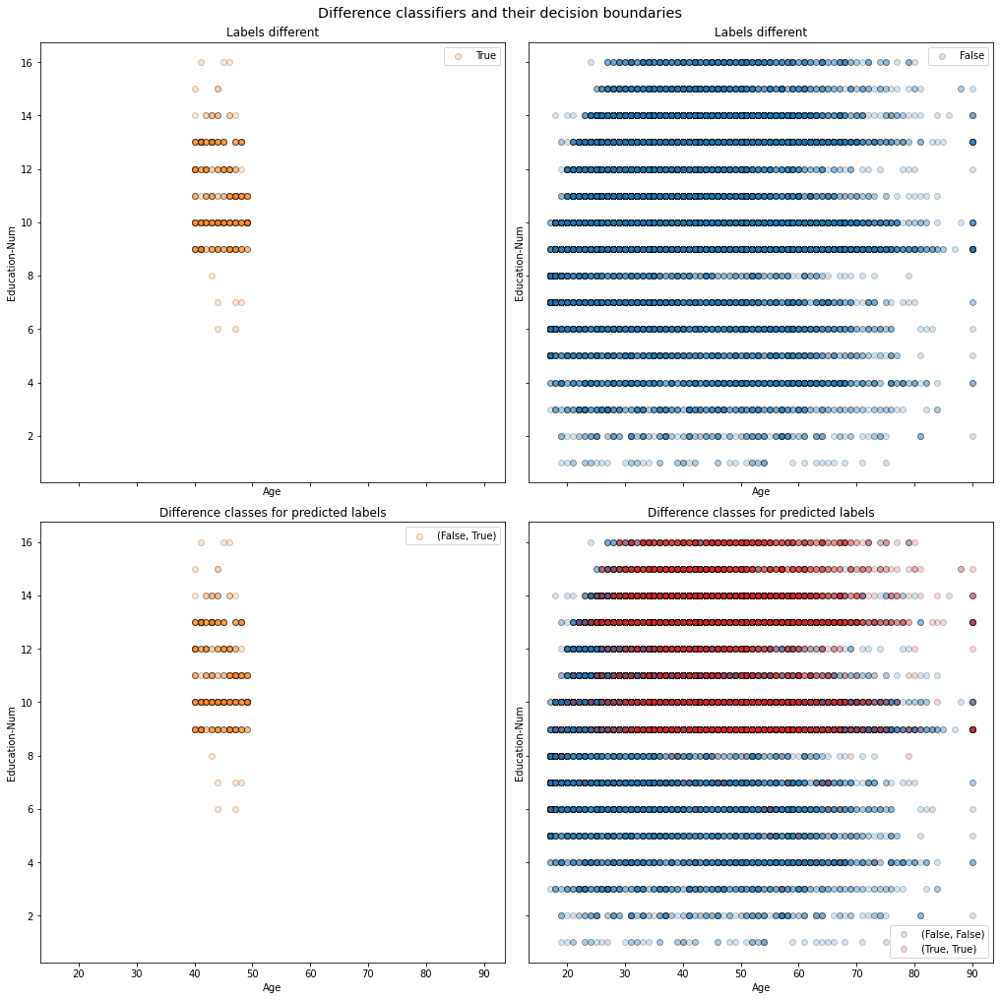

In [8]:
comparer.plot_decision_boundaries(X, display_data, kind='label', idx_x=0, idx_y=2, separate=True, alpha=0.2)

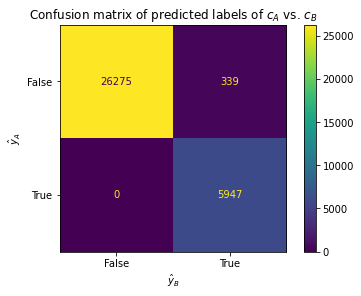

In [9]:
comparer.plot_confusion_matrix(X)

# Explain using Interpretability Methods

In [9]:
%%time
explanations = generate_shap_explanations(comparer, X_explain, display_data_explain)
with open(task_name + '.expl', 'wb') as f:
    pickle.dump(explanations, f, pickle.HIGHEST_PROTOCOL)

Permutation explainer: 15001it [02:52, 83.32it/s]                            
Permutation explainer: 15001it [03:04, 77.01it/s]                            
divide by zero encountered in log
divide by zero encountered in log
invalid value encountered in subtract
invalid value encountered in subtract
divide by zero encountered in log
divide by zero encountered in log
divide by zero encountered in log
divide by zero encountered in log
divide by zero encountered in log
divide by zero encountered in log
invalid value encountered in subtract
invalid value encountered in subtract
divide by zero encountered in log
divide by zero encountered in log
invalid value encountered in subtract
invalid value encountered in subtract
divide by zero encountered in log
divide by zero encountered in log
invalid value encountered in subtract
invalid value encountered in subtract
divide by zero encountered in log
divide by zero encountered in log
Permutation explainer:  16%|█▌        | 2385/15000 [00:43<03:16,

CPU times: user 52min 47s, sys: 5min 28s, total: 58min 15s
Wall time: 35min 38s


## Visualize SHAP values

### Individual explanations

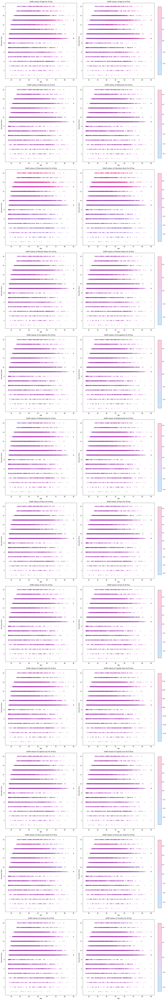

In [7]:
plot_2d(explanations.indiv.labels[:, :, ['A-True', 'B-True']], x='Age', y='Education-Num', alpha=0.2)

### Simple subtraction explanation

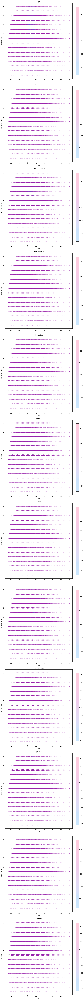

In [8]:
plot_2d(explanations.indiv_diff.labels[:, :, 'True'], x='Age', y='Education-Num', alpha=0.2)

### Multiclass difference classifier explanations

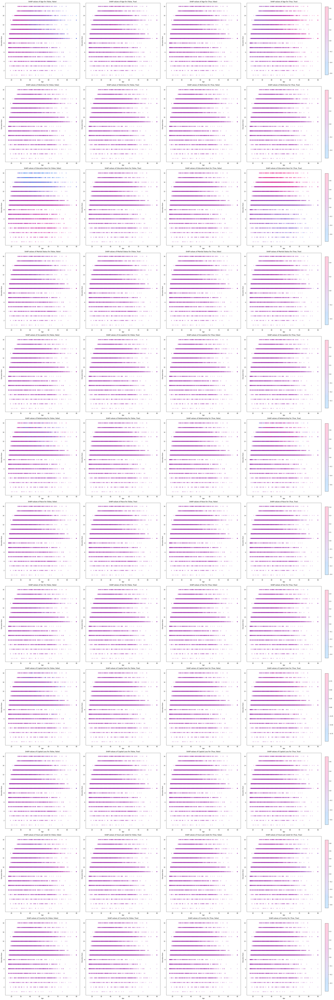

In [9]:
plot_2d(explanations.mclass_diff.labels, x='Age', y='Education-Num', alpha=0.2)

## Feature importance

### Individual explanations

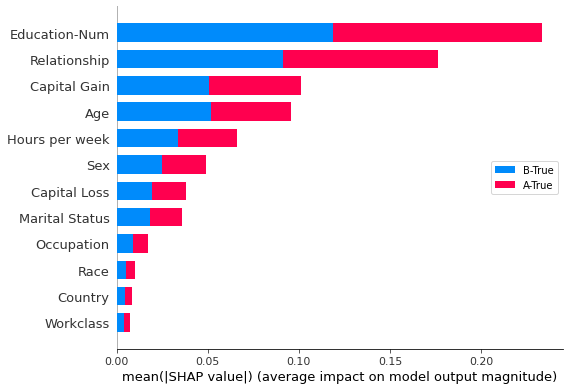

In [10]:
plot_feature_importance_bar(explanations.indiv.labels[:, :, ['A-True', 'B-True']])

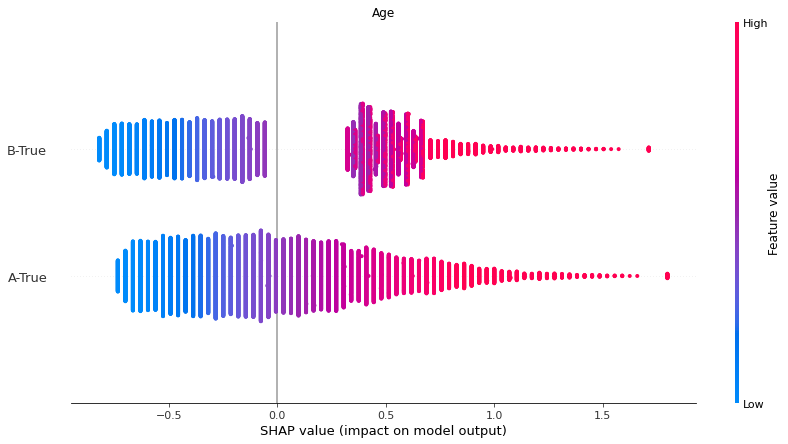

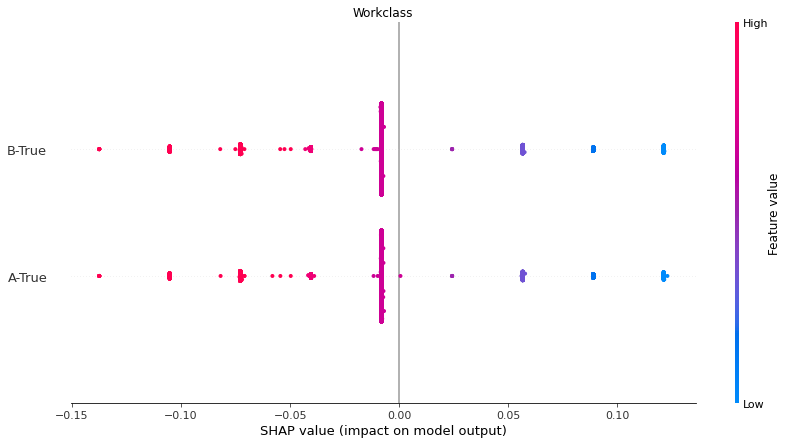

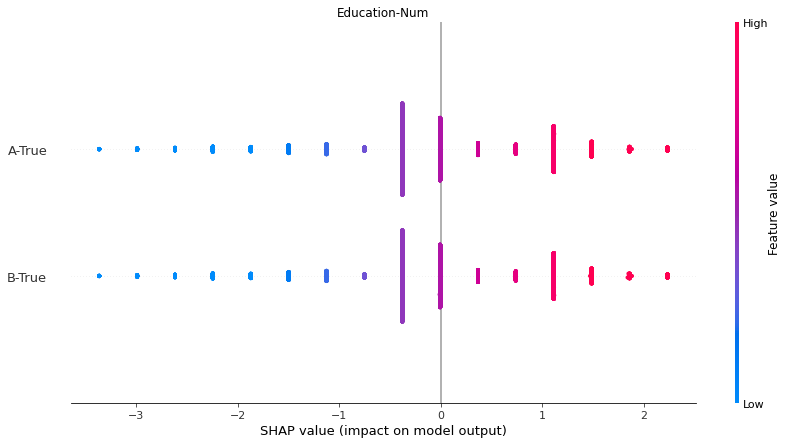

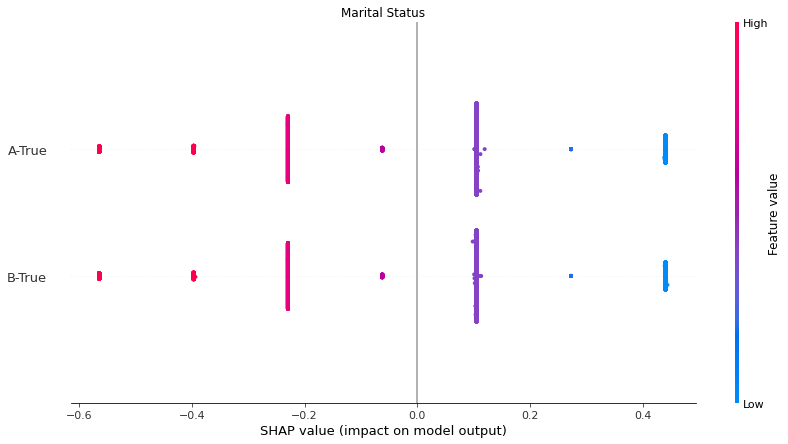

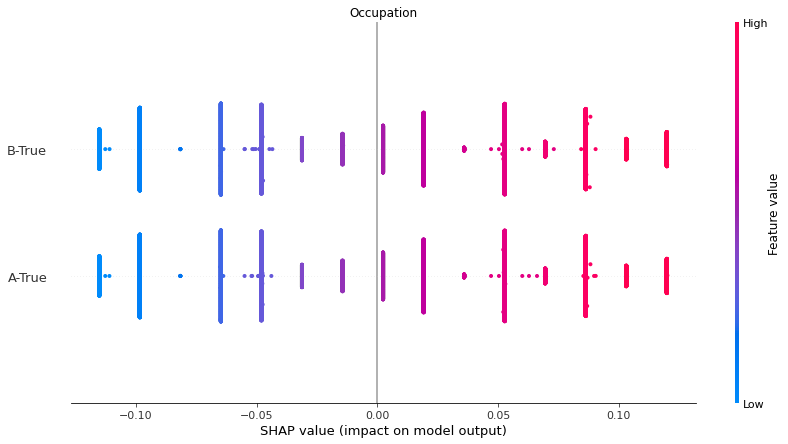

...

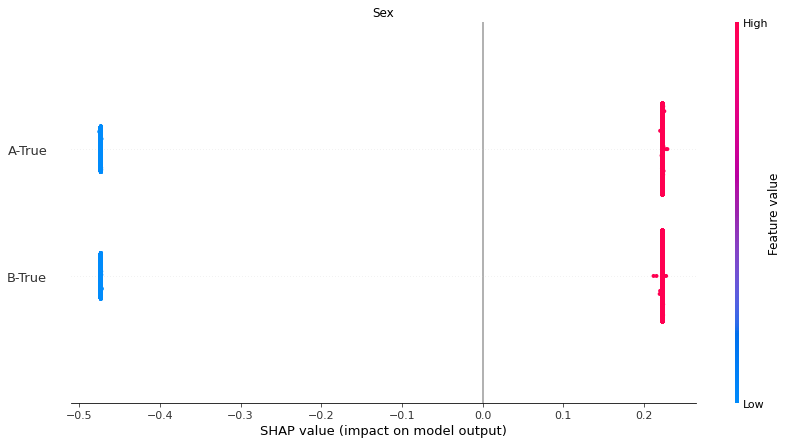

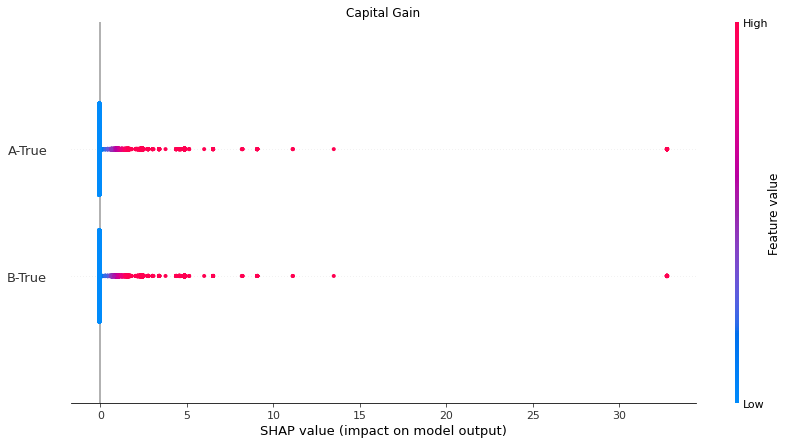

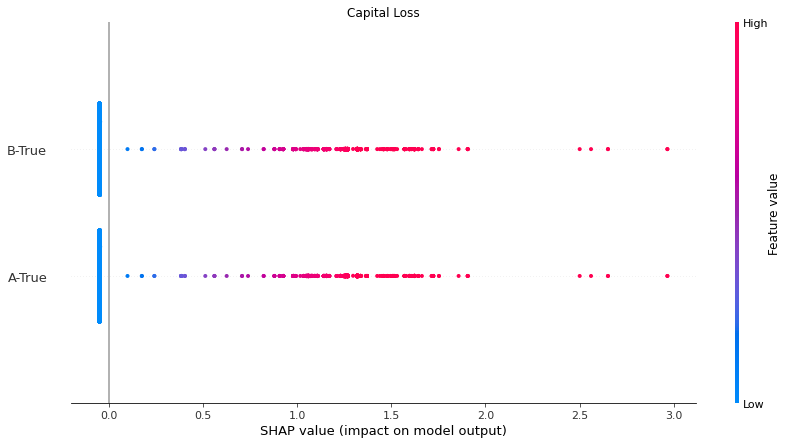

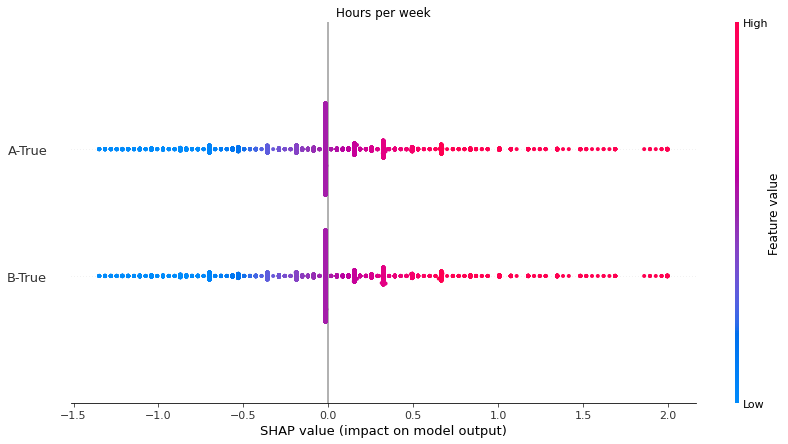

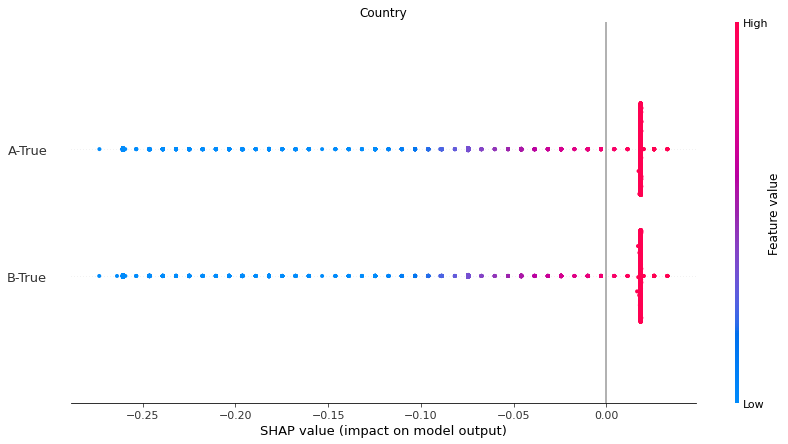

In [35]:
plot_feature_importance_scatter(explanations.indiv.log_odds[:, :, ['A-True', 'B-True']])

### Simple subtraction explanation

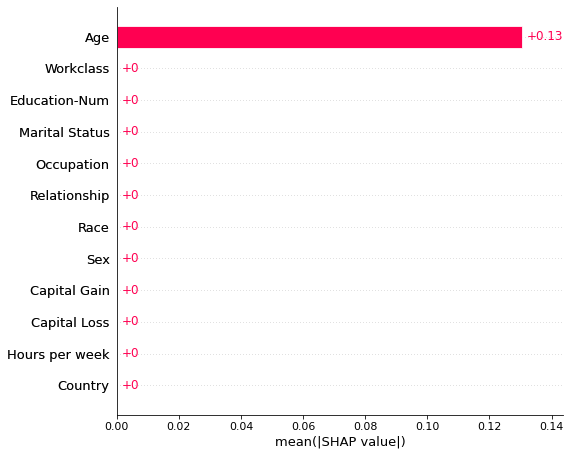

In [38]:
plot_feature_importance_bar(explanations.indiv_diff.log_odds[:, :, 1])

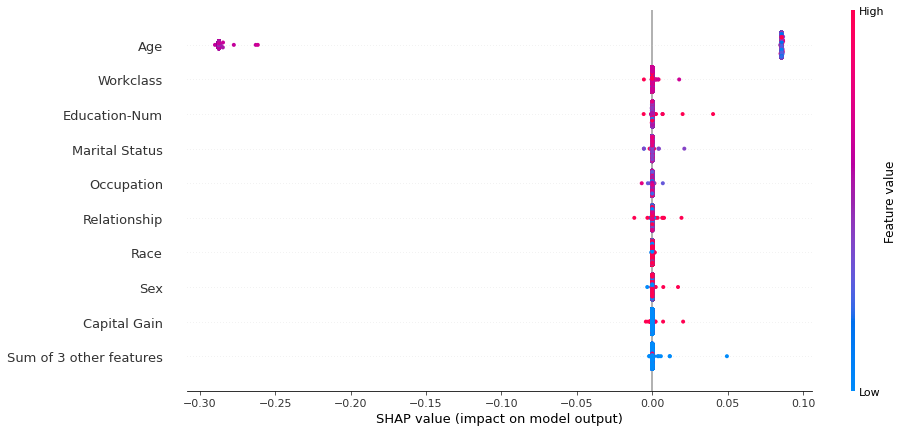

In [37]:
plot_feature_importance_scatter(explanations.indiv_diff.log_odds[:, :, 1])

### Multiclass difference classifier explanations

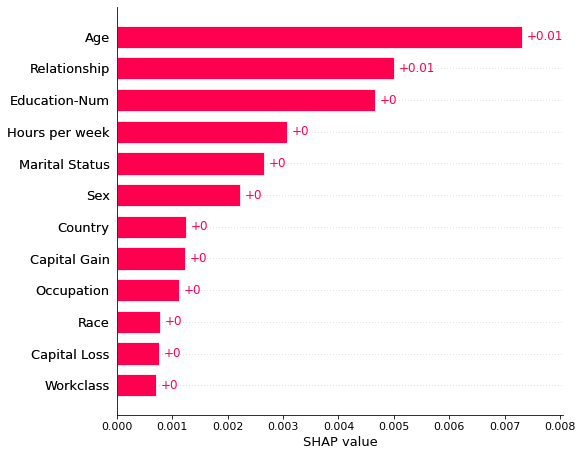

In [26]:
feature_order, feature_importance = calc_feature_order(explanations.mclass_diff.labels[:, :, comparer.difference_class_names])
plot_feature_importance_bar(feature_importance)

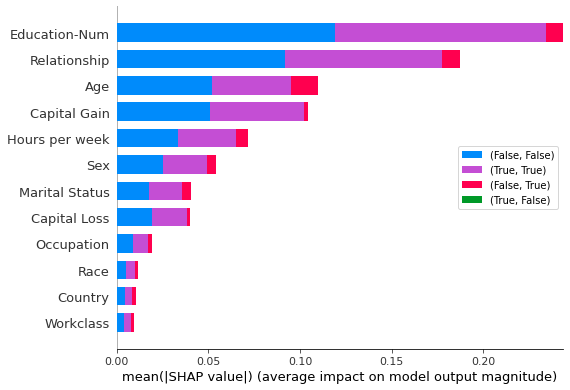

In [27]:
plot_feature_importance_bar(explanations.mclass_diff.labels)

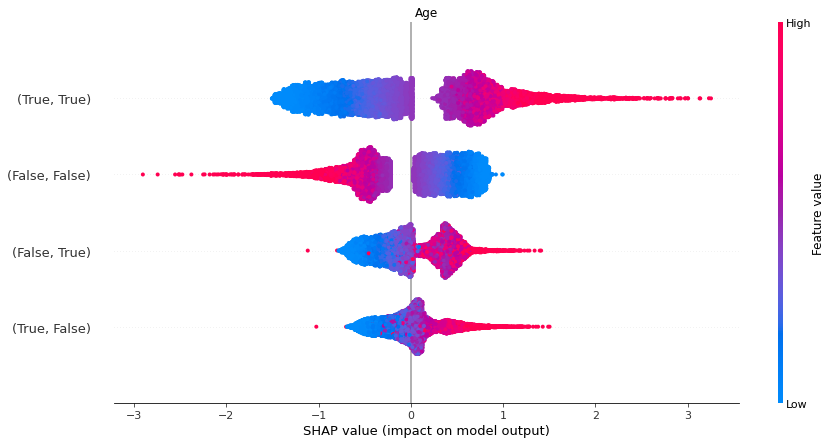

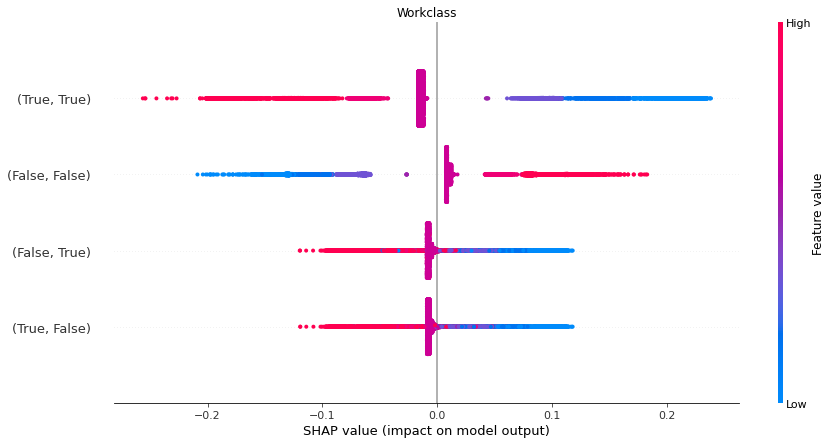

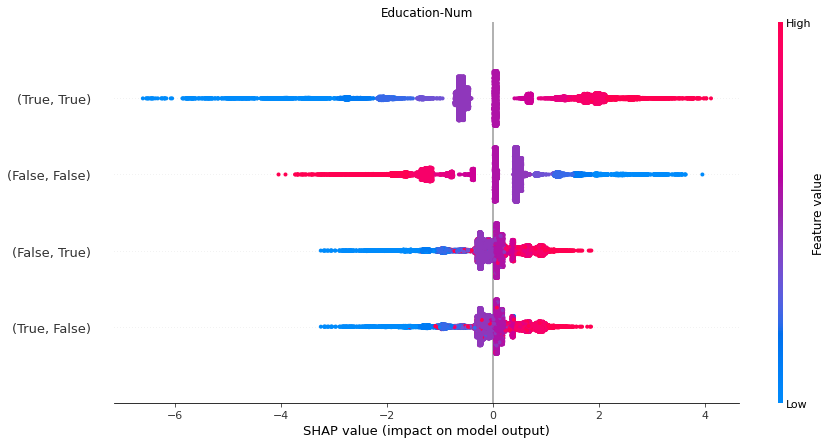

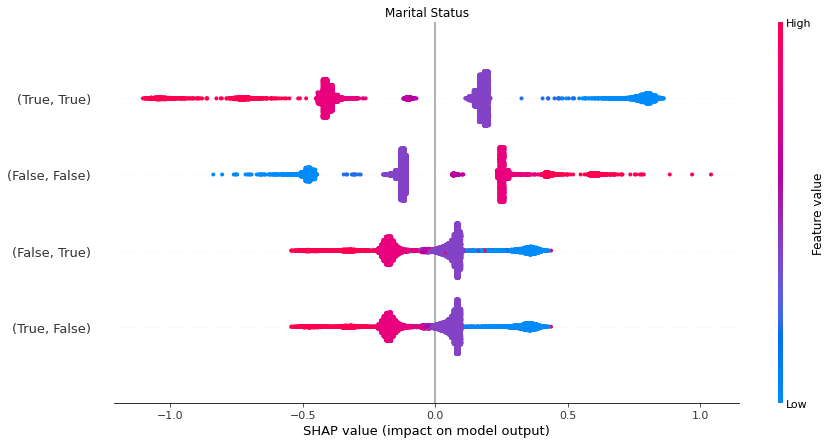

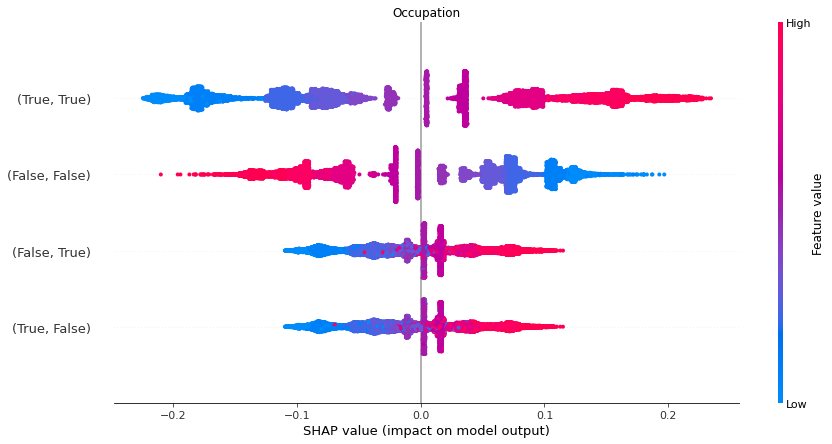

...

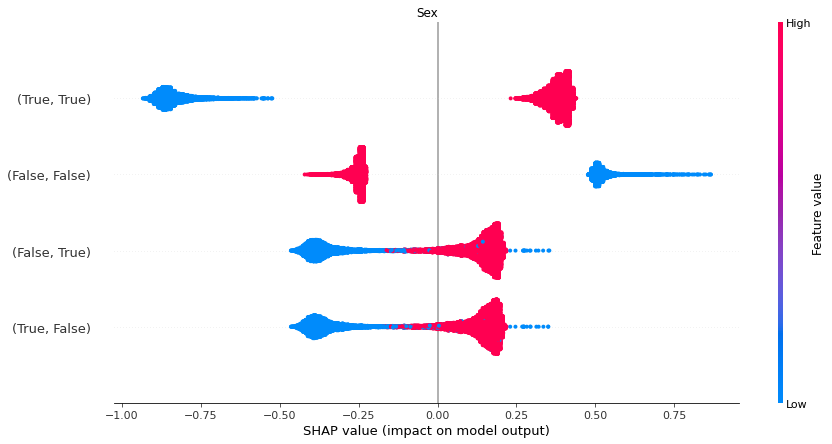

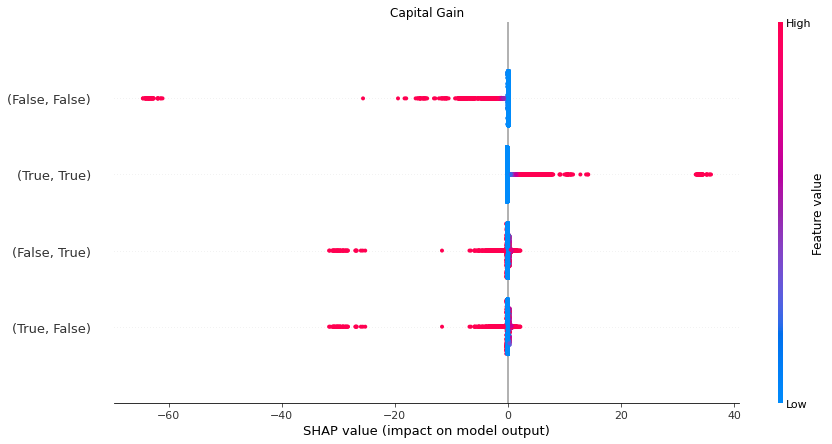

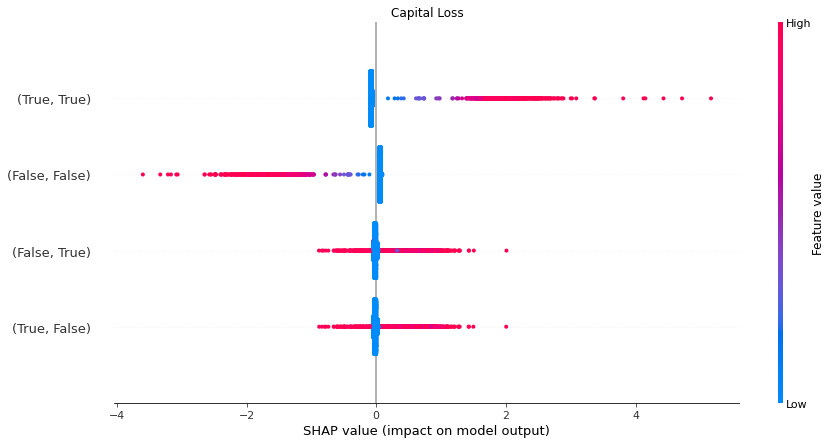

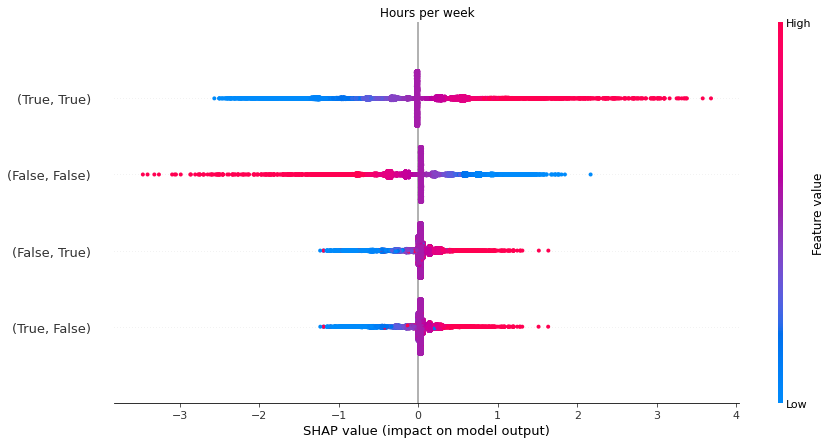

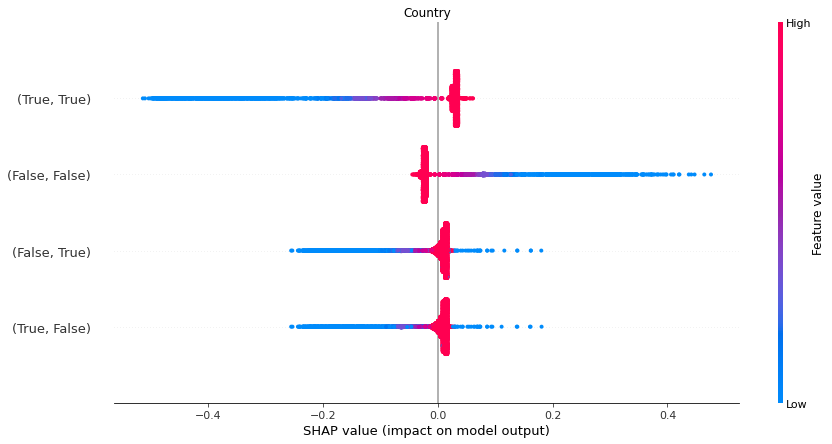

In [39]:
plot_feature_importance_scatter(explanations.mclass_diff.log_odds)

## Feature effects

### Individual explanations

Passing the fontdict parameter of _set_ticklabels() positionally is deprecated since Matplotlib 3.3; the parameter will become keyword-only two minor releases later.


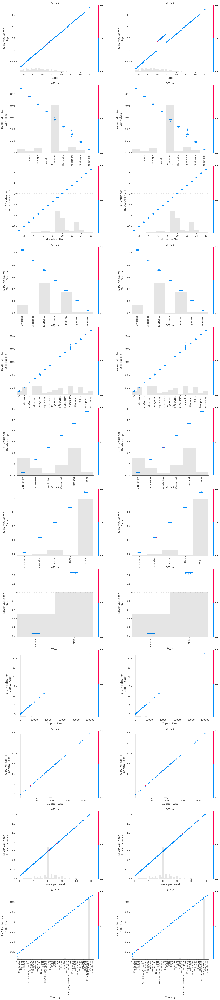

In [40]:
is_pred_diff = comparer.predict_bin_diff(explanations.data)
plot_feature_effects(explanations.indiv.log_odds[:, :, ['A-True', 'B-True']], color=is_pred_diff)

### Simple subtraction explanation

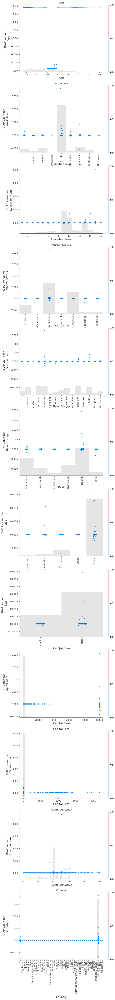

In [41]:
plot_feature_effects(explanations.indiv_diff.log_odds[:, :, 1], color=is_pred_diff)

### Multiclass difference classifier explanations

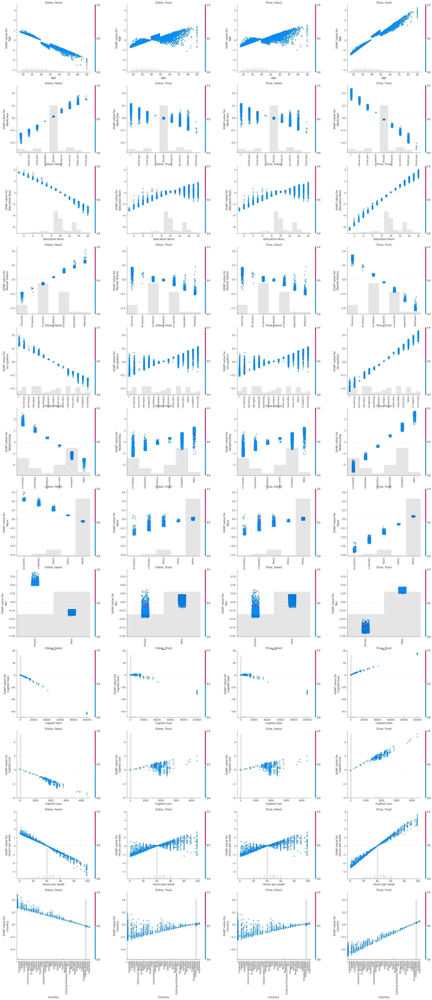

In [42]:
plot_feature_effects(explanations.mclass_diff.log_odds, color=is_pred_diff)

## Cluster instances

### Individual explanations

In [18]:
is_pred_diff = comparer.predict_bin_diff(explanations.data)
np.sum(is_pred_diff)

156

In [25]:
from sklearn.utils import shuffle
is_pred_diff_indices = np.where(is_pred_diff)[0]
is_pred_equal_indices = np.where(~is_pred_diff)[0]
is_pred_equal_indices = shuffle(is_pred_equal_indices, n_samples=1000-len(is_pred_diff_indices), random_state=0)
sample_indices = np.concatenate((is_pred_diff_indices, is_pred_equal_indices))

In [28]:
sample = explanations[sample_indices]
instance_order = calc_instance_order(sample.mclass_diff.labels)

In [45]:
plot_forces(sample.indiv.proba[:, :, ['A-True', 'B-True']], instance_order=instance_order)

### Simple subtraction explanation

In [46]:
plot_forces(sample.indiv_diff.proba, instance_order=instance_order)

### Multiclass difference classifier explanations

In [47]:
plot_forces(sample.mclass_diff.proba[:, :, comparer.difference_class_names], instance_order=instance_order)